Implemantation of the LOO algoritm for a Decision Tree model with Feature Selection on Lipizzan horses data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
import seaborn as sns
from sklearn import tree
from sklearn.metrics import confusion_matrix
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.feature_selection import f_classif, SelectPercentile

In [2]:
all_anatomy_LR1=pd.read_excel('.\Lippa_data.xlsx','Anatomy', index_col='ID')
all_anatomy_LR1=all_anatomy_LR1.drop(['Timestamp', 'Horse', 'Temperature'], axis=1)
all_anatomy_LR2=pd.read_excel('.\Lippa_data_25ijs.xlsx','Anatomy', index_col='ID')
all_anatomy_LR2=all_anatomy_LR2.drop(['Horse'], axis=1)
all_anatomy_LR=all_anatomy_LR1.append(all_anatomy_LR2).sort_index()
all_anatomy_LR['Sex']=all_anatomy_LR['Sex'].replace(['M','G'],['1','0'])

d:\Users\alexatopal\AppData\Local\Temp\13\ipykernel_47232\1128044065.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  all_anatomy_LR=all_anatomy_LR1.append(all_anatomy_LR2).sort_index()


In [3]:
kinematics1=pd.read_excel('.\Lippa_experiments.xlsx','Kinematics_all', index_col='ID')
kinematics2=pd.read_excel('.\Lippa_experiments.xlsx','Kinematics_all_new25', index_col='ID')
kinematics_all=kinematics1.append(kinematics2).sort_index()

d:\Users\alexatopal\AppData\Local\Temp\13\ipykernel_47232\2403242403.py:3: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  kinematics_all=kinematics1.append(kinematics2).sort_index()


In [4]:
housing1=pd.read_excel('.\Lippa_data.xlsx','Housing and work', index_col='ID')
housing1=housing1.drop(['Horse', 'Timestamp', 'School horse', 'Housing', 'Equine activities', 'Pasture', 'Number of caretakers', 'Box openess', 'Injury history' ], axis=1)
housing1['Type of work']='no'
housing1['Type of work']=housing1['Type of work'].where((housing1['Type of work']=='no')&(housing1['Work']==1), 'riding')
housing2=pd.read_excel('.\Lippa_data_25ijs.xlsx','Housing and work', index_col='ID')
housing2=housing2.drop(['Horse'], axis=1)
housing2['Work']=housing2['Work'].replace(['yes','no'],[2,1])
housing=housing1.append(housing2).sort_index()
type_of_work=housing['Type of work'].unique()
housing['Type of work']=housing['Type of work'].replace(list(type_of_work), [0,1,2,3]) #no=0, riding=1,in training=2,show=3

d:\Users\alexatopal\AppData\Local\Temp\13\ipykernel_47232\2938521226.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  housing=housing1.append(housing2).sort_index()


In [5]:
digital_measurment_of_head1=pd.read_excel('.\Additional data 24 horses.xlsx','Head anatomy', index_col='ID')
digital_measurment_of_head1=digital_measurment_of_head1.drop(['Horse'], axis=1)
digital_measurment_of_head2=pd.read_excel('.\Lippa_data_25ijs.xlsx','Additional anatomy', index_col='ID')
digital_measurment_of_head2=digital_measurment_of_head2.drop(['Horse'], axis=1)
digital_measurment_of_head=digital_measurment_of_head1.append(digital_measurment_of_head2).sort_index()

d:\Users\alexatopal\AppData\Local\Temp\13\ipykernel_47232\1343968500.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  digital_measurment_of_head=digital_measurment_of_head1.append(digital_measurment_of_head2).sort_index()


In [6]:
whorls_of_head1=pd.read_excel('.\Additional data 24 horses.xlsx','Whorls',index_col='ID' ) 
whorls_of_head1=whorls_of_head1.drop(['Horse', 'Number of whorls', 'Whorl2_Rotation', 'Whorl2_Height', 'Whorl2_Lateral location'], axis=1)
whorls_of_head2=pd.read_excel('.\Lippa_data_25ijs.xlsx','Whorls',index_col='ID' ) 
whorls_of_head2=whorls_of_head2.drop(['Horse', 'Number of whorls', 'Whorl2_Rotation', 'Whorl2_Height', 'Whorl2_Lateral location'], axis=1)
whorls_of_head=whorls_of_head1.append(whorls_of_head2).sort_index()

d:\Users\alexatopal\AppData\Local\Temp\13\ipykernel_47232\505618849.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  whorls_of_head=whorls_of_head1.append(whorls_of_head2).sort_index()


In [7]:
fear_max_sum=pd.read_excel('.\Lippa_experiments.xlsx','Fear_max_sum49', index_col='ID')
fear_max_sum=fear_max_sum.sort_index()

Text(0, 0.5, 'Number of horses')

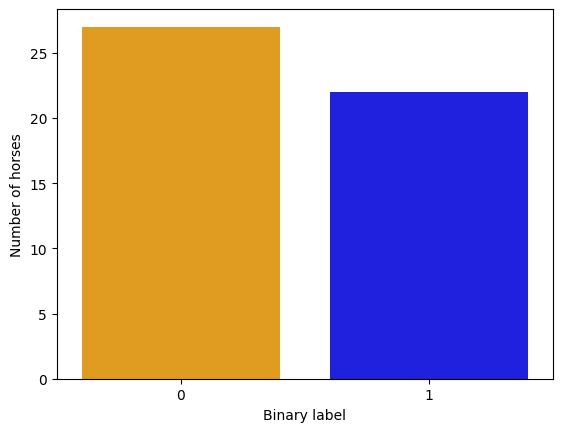

In [8]:
#target features = maximum from sum of repetition divided to two classes.
y=fear_max_sum['binary'] 
tt=fear_max_sum['binary'].value_counts()
plt.figure()
sns.barplot(x=tt.index, y=tt, palette=['orange', 'blue']);
plt.xlabel("Binary label") 
plt.ylabel('Number of horses')

In [9]:
y=y.sort_index()
y.value_counts()


0    27
1    22
Name: binary, dtype: int64

In [10]:
X_initial=pd.concat([all_anatomy_LR, kinematics_all, housing, digital_measurment_of_head, whorls_of_head], axis=1)

#remove features that correlate with each other 
empty_list=[]
# LEFT+front measurements
corr_list_left=["FH10L", "FH11L", "FH12L", "FH13L", "FH14L", "FH16L", "FH18L", "FH19L", "FB08", "FB10L", "FB11L", "FB12L", "FB13L", \
            "FB15L", "FB16L", "FB18L", "FB19L", "FB20L", "FB21L", "FB22L", "FB23L", "FB24L", "FB25L", "FB26L", "FB27L", "FB28L",\
            "FB29L", "FB31L", "FB32L", "FB34L", "FB35L", "FB36L", "FB37L", "FB38", "FB39", "Walk_DV power", "Trot_Stride lengh",\
            "Work", "HMPF1", "HMPF2", "HMPF3", "HMPF4", "HMPF6", "HMPF22", "HMPF23",  "HMPF25", "HMPF27", "HMPF31",\
            "HMPF34", "HMPF35", "HMPF39", "HMPF37", "HMPF41", "HMPF43", "HMPF45", "HMPF47", "HMPL2", "HMPL11", "HMPL12","HMPL15"]

# RIGHT+front measurements
corr_list_right=["FH10R","FH11R","FH12R","FH13R","FH14R","FH16R","FH18R","FH19R","FB09","FB10R","FB11R","FB12R","FB12R","FB13R","FB14R",\
            "FB15R","FB16R","FB18R","FB19R","FB20R","FB21R","FB22R","FB23R","FB24R","FB25R","FB26R","FB27R","FB28R","FB29R","FB31R",\
            "FB32R","FB34R","FB35R","FB36R","FB37R","FB39","FB40","Walk_Speed","Trot_Speed","Type of work","HMPF2","HMPF3","HMPF5","HMPF7",\
            "HMPF20","HMPF21","HMPF24","HMPF26","HMPF30","HMPF32","HMPF33","HMPF36","HMPF38","HMPF40","HMPF42","HMPF44","HMPF46","HMPF69",\
            "HMPR2","HMPR11","HMPR12","HMPR15"]

# LEFT + additianal right + front measurements
corr_list_left_add=["FH10L", "FH11L", "FH12L", "FH13L", "FH14L", "FH16L", "FH18L", "FH19L", "FB08", "FB10L", "FB11L", "FB12L", "FB13L", \
            "FB15L", "FB16L", "FB18L", "FB19L", "FB20L", "FB21L", "FB22L", "FB23L", "FB24L", "FB25L", "FB26L", "FB27L", "FB28L",\
            "FB29L", "FB31L", "FB32L", "FB34L", "FB35L", "FB36L", "FB37L", "FB38", "FB39", "Walk_DV power", "Trot_Stride lengh",\
            "Work", "HMPF1", "HMPF2", "HMPF3", "HMPF4", "HMPF6", "HMPF22", "HMPF23", "HMPF45", "HMPF25", "HMPF27", "HMPF31",\
            "HMPF34", "HMPF35", "HMPF39", "HMPF37", "HMPF41", "HMPF43", "HMPF45", "HMPF47", "HMPL2", "HMPL11", "HMPL12","HMPL15",\
            "HMPF30", "HMPF32", "HMPF69", "HMPR2", "HMPR11", "HMPR12","HMPR15"] 

# # RIGHT + additianal left + front measurements
corr_list_right_add=["FH10R","FH11R","FH12R","FH13R","FH14R","FH16R","FH18R","FH19R","FB09","FB10R","FB11R","FB12R","FB12R","FB13R","FB14R",\
            "FB15R","FB16R","FB18R","FB19R","FB20R","FB21R","FB22R","FB23R","FB24R","FB25R","FB26R","FB27R","FB28R","FB29R","FB31R",\
            "FB32R","FB34R","FB35R","FB36R","FB37R","FB39","FB40","Walk_Speed","Trot_Speed","Type of work","HMPF2","HMPF3","HMPF5","HMPF7",\
            "HMPF20","HMPF21","HMPF24","HMPF26","HMPF30","HMPF32","HMPF33","HMPF36","HMPF38","HMPF40","HMPF42","HMPF44","HMPF46","HMPF71",\
            "HMPR2","HMPR11","HMPR12","HMPR15", "FB12L", "HMPF23", "HMPF35", "HMPF39", "HMPF45", "HMPL12", "HMPL13", "HMPL17"]    


#left column of corr matrix
corr_list_feature1=["FH10L","FH11L","FH12L","FH13L","FH14L","FH16L","FH18L","FH19L","FB08","FB10L","FB11L","FB12L","FB13L","FB15L","FB16L","FB18L",\
           "FB19L","FB20L","FB21L","FB22L","FB23L","FB24L","FB25L","FB26L","FB27L","FB28L","FB29L","FB31L","FB32L","FB34L","FB35L","FB36L",\
           "FB37L","FB38","FB39","Walk_DV power","Trot_Stride lengh","Work","HMPF1","HMPF2","HMPF3","HMPF4","HMPF6","HMPF20","HMPF21","HMPF22",\
           "HMPF24", "HMPF26", "HMPF30", "HMPF32", "HMPF33", "HMPF34", "HMPF36", "HMPF38", "HMPF40", "HMPF42", "HMPF44", "HMPF46", "HMPF69",\
           "HMPL2", "HMPL11", "HMPL12", "HMPL15", "HMPR2", "HMPR11", "HMPR12", "HMPR15"]

#right column of corr matrix
corr_list_feature2=["FH10R","FH11R","FH12R","FH13R","FH14R","FH16R","FH18R","FH19R","FB09","FB10R","FB11R","FB12L","FB12R","FB13R","FB14R","FB15R",\
        "FB16R","FB18R","FB19R","FB20R","FB21R","FB22R","FB23R","FB24R","FB25R","FB26R","FB27R","FB28R","FB29R","FB31R","FB32R","FB34R","FB35R",\
        "FB36R","FB37R","FB39","FB40","Walk_Speed","Trot_Speed","Type of work","HMPF2","HMPF3","HMPF5","HMPF7","HMPF22","HMPF23","HMPF45",\
        "HMPF25", "HMPF27","HMPF31", "HMPF32","HMPF33", "HMPF34","HMPF35","HMPF38","HMPF39","HMPF37","HMPF41","HMPF43","HMPF45","HMPF47",\
        "HMPF71","HMPL13","HMPL12","HMPL17","HMPR11","HMPR12","HMPR13","HMPR17"]



In [11]:
X_initial=X_initial.sort_index()

In [12]:

rs_list=list(range(1, 150)) #you can try a wider range, but it will take longer  
full_corr_list=[empty_list, corr_list_left, corr_list_right, corr_list_left_add, corr_list_right_add, corr_list_feature1, corr_list_feature2]

def split_by_hand(Features,goal,number):
    y_test=goal[[number]] #chose a value from y
    X_test=Features.iloc[[number]] #chose a value from X
    y_train=np.delete(np.array(goal),(number)) #remove test_instance from the set
    X_train=Features.drop(Features.index[number]) #remove test_instance from the set
    return X_train, X_test, y_train, y_test

max_acc=0
number_of_horses=len(X_initial)

for corr_list in full_corr_list:
    X=X_initial.drop(corr_list, axis=1)
    max_acc=0
    for rs in rs_list:
        accuracy_list=[]
        precision_list=[]
        recall_list=[]
        best_param=[]

        prediction=[]
        selection_features=pd.DataFrame()
        
        for test_instance in range(number_of_horses):

            X_train, X_test, y_train, y_test=split_by_hand(X,y,test_instance)
            
            X_percentile_features_f=SelectPercentile(f_classif, percentile=17).fit(X_train, y_train)
            df_scores = pd.DataFrame({'features':X_percentile_features_f.feature_names_in_, 'f_classif_Score': X_percentile_features_f.scores_, 'pValue': X_percentile_features_f.pvalues_ })
                    
            df_scores=df_scores[df_scores['pValue']<0.051] 
            len_df_scores=len(df_scores)
            my_percentile=len_df_scores*100/len(X.columns)
            X_percentile_features_f=SelectPercentile(f_classif, percentile=my_percentile).fit(X_train, y_train)
            
            X_percentile=X_percentile_features_f.transform(X_train)
            
            removed_features=[]
            all_features_list=np.array(df_scores.features)
        
        
        # removed columns in X_test
            for i in X_test.columns:
                if i not in all_features_list:
                    removed_features.append(i)
            X_test=X_test.drop(removed_features, axis=1)    
                
                
            DT_model=tree.DecisionTreeClassifier(criterion='gini', random_state=rs, max_features='sqrt') 
            
            DT_model.fit(X_percentile,y_train) # X_train
        
            y_predict=DT_model.predict(X_test)  
        
            prediction.append([y_test[0], y_predict[0]])
            if (y_predict[0]==y_test[0]):
                accuracy_list.append(1)
            
            feats=pd.DataFrame(index=df_scores['features'], data=DT_model.feature_importances_, columns=['Important'])
            selection_features=pd.concat([selection_features, feats])
        
        print(rs, '->', sum(accuracy_list)/number_of_horses, file=open('output_DT_FS_experiment.txt', 'a'))
        if sum(accuracy_list)/number_of_horses>max_acc:
            max_acc=sum(accuracy_list)/number_of_horses
            random_st=rs
    print('Random_state=', random_st, "Accuracy=",  max_acc, 'set=', len(X.columns)) 

218


d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


Random_state= 122 Accuracy= 0.7346938775510204 set= 218
158


d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


Random_state= 78 Accuracy= 0.7346938775510204 set= 158
157


d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


Random_state= 73 Accuracy= 0.6938775510204082 set= 157
151


d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


Random_state= 46 Accuracy= 0.6938775510204082 set= 151
149


d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


Random_state= 14 Accuracy= 0.6938775510204082 set= 149
151


d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


Random_state= 116 Accuracy= 0.7142857142857143 set= 151
150


d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


Random_state= 27 Accuracy= 0.8163265306122449 set= 150


d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(
d:\Users\alexatopal\Desktop\Work\Lipizianzi\.venv\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


<Axes: >

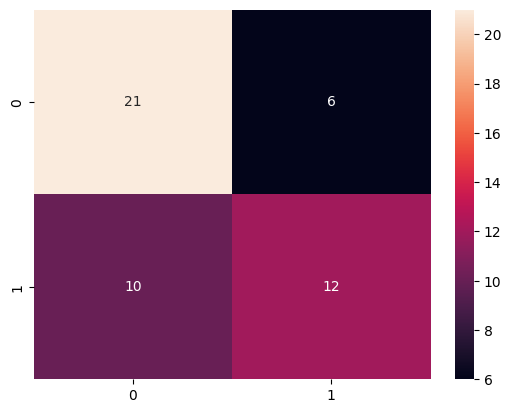

In [13]:
prediction=np.array(prediction)
sns.heatmap(confusion_matrix(prediction[:,0], prediction[:,1]), annot=True)

In [14]:
compare_matrix=confusion_matrix(prediction[:,0], prediction[:,1])
print(compare_matrix)                                        
precision=compare_matrix[1][1]/(compare_matrix[1][1]+compare_matrix[0][1])
print('Precision=', precision)
recall=compare_matrix[1][1]/(compare_matrix[1][1]+compare_matrix[1][0])
print('Recall=', recall)

[[21  6]
 [10 12]]
Precision= 0.6666666666666666
Recall= 0.5454545454545454


In [15]:
selection_features[selection_features['Important']!=0]


,Important
features,
FB10L,0.055944
FB11L,0.092480
FB16L,0.030286
FB30R,0.078322
Number of boxes,0.140223
...,...
HMPF1,0.069930
HMPF42,0.067918
HMPF77,0.070204


features
FB16L                    36
Age                      26
FB34L                    23
HMPL4                    22
HMPF1                    22
FB29L                    20
HMPF77                   19
HMPL5                    19
Walk_Propulsion power    19
FB37L                    18
Trot_Stride lengh        17
HMPF62                   16
Trot_DV power            16
Trot_Regularity          15
HMPF42                   15
HMPF73                   13
Number of boxes          12
Whorl1_Rotation          12
FB22L                    11
HMPF65                   11
HMPR15                   10
FB11L                    10
FB30R                    10
FB17R                    10
dtype: int64


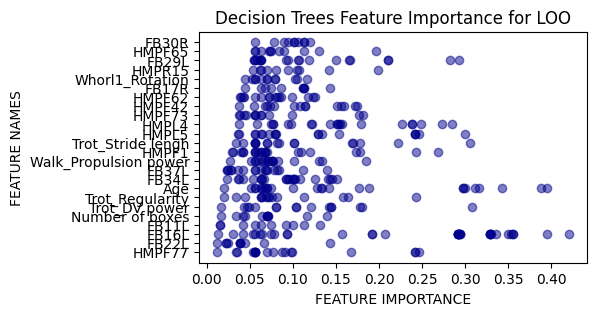

In [23]:

#print(log_model.coef_)
#print(*best_param, sep='\n')
forplot=selection_features[selection_features['Important']!=0].sort_values(['Important'], axis=False)
#print(forplot.value_counts(forplot.index))

sf_list=list(forplot.index)
tt=[i for i in sf_list if sf_list.count(i)<10]
unique=list(set(tt))
for i in unique:
    forplot=forplot.drop(i, axis=0)
print(forplot.value_counts(forplot.index))
plt.figure(figsize=(5,3))
plt.scatter(x=forplot['Important'], y=forplot.index, color='darkblue', alpha=0.5)
plt.title('Decision Trees ' + 'Feature Importance for LOO')
plt.xlabel('FEATURE IMPORTANCE')
plt.ylabel('FEATURE NAMES');
# plt.axline((0.35, 0), ((0.35, 1)), c='red');



In [24]:
# Modeling on the full dataset

DTall_model=DecisionTreeClassifier(criterion='gini',  max_features='sqrt', random_state=104) #the best random_state=111

X_select=SelectPercentile(f_classif, percentile=17).fit(X, y)
df_scores = pd.DataFrame({'features':X_select.feature_names_in_, 'f_classif_Score': X_select.scores_, 'pValue': X_select.pvalues_ })
df_scores=df_scores[df_scores['pValue']<0.051] #14 (8 -> 10) (17 -> 21)#

len_df_scores=len(df_scores)
my_percentile=len_df_scores*100/len(X.columns)
X_select=SelectPercentile(f_classif, percentile=my_percentile).fit(X, y)

X_sel_perc=X_select.transform(X)

DTall_model.fit(X_sel_perc,y)
feats_=pd.DataFrame(index=df_scores['features'], data=DTall_model.feature_importances_, columns=['Important'])
feats_[feats_['Important']>0].sort_values('Important', ascending=False)


,Important
features,
HMPL4,0.291609
Age,0.198318
FB30R,0.127862
FB29L,0.061869
Trot_Regularity,0.061869
HMPF77,0.054994
FB37L,0.053030
FB17R,0.043996
HMPF1,0.041246


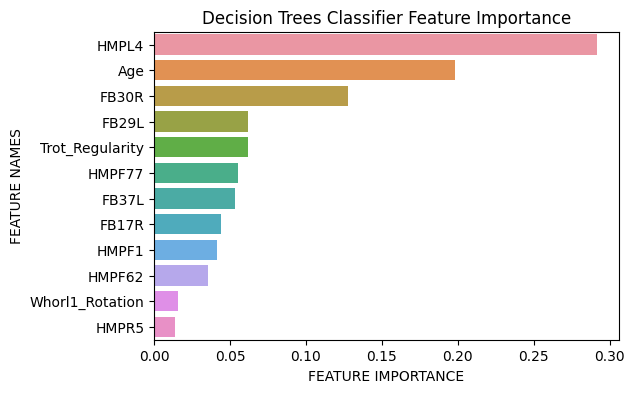

In [25]:
feats_for_plot=feats_[feats_['Important']>0].sort_values('Important', ascending=False)
plt.figure(figsize=(6,4))
#Plot Searborn bar chart
sns.barplot(x=feats_for_plot['Important'], y=feats_for_plot.index)
#Add chart labels
plt.title('Decision Trees Classifier ' + 'Feature Importance')
plt.xlabel('FEATURE IMPORTANCE')
plt.ylabel('FEATURE NAMES');

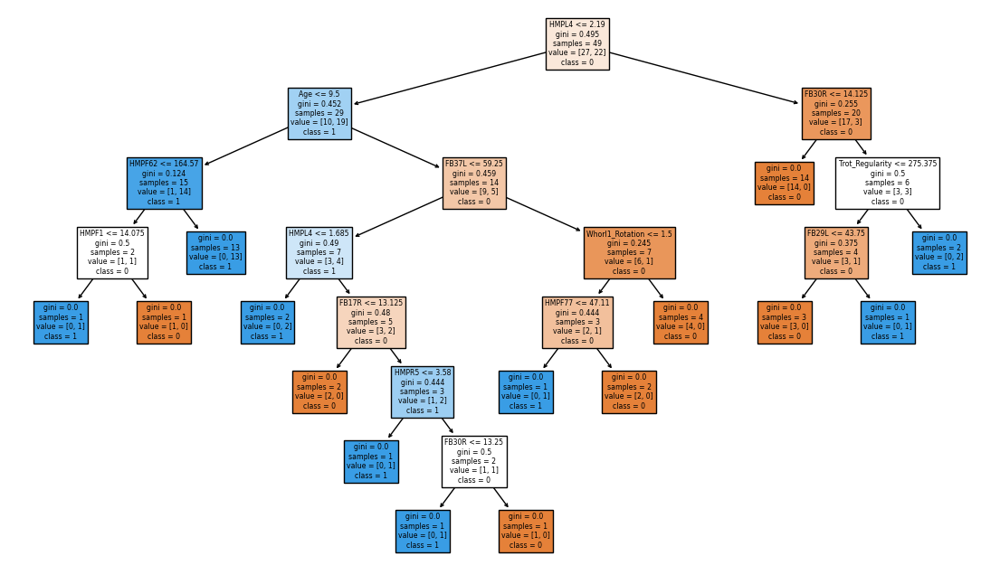

In [26]:
fig = plt.figure(figsize=(14,8))
_ = tree.plot_tree(DTall_model, feature_names=feats_.index, class_names='01', filled=True)